# Grad-CAM for top-performing worm model families

This notebook extends the single-run Grad-CAM workflow to multiple sweep runs.

It will:

1. find all sweep directories under `outputs_slurm/`;
2. aggregate all `run_*/multi_run_results.csv` files;
3. select the best run within each model family, using `model.name` from `run_overrides.args` or `config.json`;
4. plot row-normalised confusion matrices for `species`, `genus`, and `age`, with raw counts and relevant scores;
5. run Grad-CAM on random examples for each selected model family;
6. save all outputs under `outputs_slurm/combined_gradcam_top_model_families/`.

For model selection, the default ranking metric is `best_val_score`, not a test metric. This avoids choosing models based on the test set.


In [79]:
from __future__ import annotations

import copy
import json
import math
import re
import shlex
import sys
import textwrap
import warnings
from dataclasses import dataclass
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F

from IPython.display import display, Markdown

PROJECT_ROOT = next(
    (parent for parent in [Path.cwd(), *Path.cwd().parents] if (parent / "src").is_dir()),
    Path.cwd(),
).resolve()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from src.worm_species.data.labels import get_target_cols
from src.worm_species.data.metadata import prepare_metadata
from src.worm_species.data.transforms import build_transforms

from src.splits import make_individual_level_splits

from src.worm_species.models import build_model

pd.set_option("display.max_columns", 160)
pd.set_option("display.max_colwidth", 160)


## 1. User settings

Set `PROJECT_ROOT` if you are not running from `~/worm-species`.

`DATA_ROOT_OVERRIDE` and `METADATA_CSV_OVERRIDE` are useful because old run configs may point to node-local `/scratch/...` paths that no longer exist.


In [80]:
# ============================================================
# USER SETTINGS
# ============================================================

# If None, all node_local_sweep_* directories under PROJECT_ROOT / outputs_slurm are used.
# You can also manually set this, for example:
# SWEEP_DIRS_MANUAL = [
#     PROJECT_ROOT / "outputs_slurm/node_local_sweep_20260703_164317",
#     PROJECT_ROOT / "outputs_slurm/node_local_sweep_20260706_122839",
# ]
SWEEP_DIRS_MANUAL = None

# Select the best run per model family using this metric.
RANK_BY = "test_mean_macro_f1"  # or "mean_test_macro_f1"

TASKS_TO_PLOT = ["species", "genus", "age"]

# Grad-CAM target:
# "pred" = CAM for predicted class
# "true" = CAM for true class when available, otherwise predicted class
CAM_MODE = "pred"

N_RANDOM_EXAMPLES = 8
RANDOM_STATE = 42

# Prefer test examples when a split column or split file is available.
PREFER_SPLIT = "test"

# Override stale node-local paths in saved configs if needed.
DATA_ROOT_OVERRIDE = Path("/mnt/extssd/Earthworms/petridish-worm-images")
METADATA_CSV_OVERRIDE = Path("/mnt/extssd/Earthworms/petridish-worm-images/01_Segmented/global_metadata.csv")

# Set these to None if your config paths are already valid:
# DATA_ROOT_OVERRIDE = None
# METADATA_CSV_OVERRIDE = None

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

ANALYSIS_DIR = PROJECT_ROOT / "tables" / "gradcam_top_model_families"
FIGURE_DIR = PROJECT_ROOT / "figures" / "gradcam_top_model_families"
ANALYSIS_DIR.mkdir(parents=True, exist_ok=True)
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

print("Device:", DEVICE)
print("Project root:", PROJECT_ROOT)
print("Analysis directory:", ANALYSIS_DIR)


Device: cuda
Project root: /home/devd/worm-species
Analysis directory: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families


## 2. Sweep discovery and aggregation

In [81]:
def safe_slug(text: str, max_len: int = 100) -> str:
    text = str(text)
    text = re.sub(r"[^a-zA-Z0-9_.-]+", "_", text)
    text = text.strip("_")
    return text[:max_len].rstrip("_")


def find_sweep_dirs() -> list[Path]:
    if SWEEP_DIRS_MANUAL is not None:
        sweep_dirs = [Path(p).expanduser().resolve() for p in SWEEP_DIRS_MANUAL]
    else:
        sweep_dirs = sorted((PROJECT_ROOT / "outputs_slurm").glob("node_local_sweep_*"))

    sweep_dirs = [
        p for p in sweep_dirs
        if p.exists() and any(p.glob("run_*/multi_run_results.csv"))
    ]

    if not sweep_dirs:
        raise FileNotFoundError(
            "No sweep directories found. Check PROJECT_ROOT or set SWEEP_DIRS_MANUAL."
        )

    seen = set()
    out = []
    for p in sweep_dirs:
        rp = p.resolve()
        if rp not in seen:
            seen.add(rp)
            out.append(rp)

    return out


SWEEP_DIRS = find_sweep_dirs()

print("Found sweep directories:")
for sweep_dir in SWEEP_DIRS:
    print(f"  {sweep_dir} ({len(list(sweep_dir.glob('run_*/multi_run_results.csv')))} result files)")


Found sweep directories:
  /home/devd/worm-species/outputs_slurm/node_local_sweep_20260703_164317 (83 result files)
  /home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839 (248 result files)


In [82]:
def read_one_results_csv(csv_path: Path, sweep_dir: Path) -> pd.DataFrame:
    df = pd.read_csv(csv_path)
    df["source_csv"] = str(csv_path)
    df["source_run_dir"] = str(csv_path.parent)
    df["source_run_id"] = csv_path.parent.name
    df["sweep_dir"] = str(sweep_dir)
    df["sweep_id"] = sweep_dir.name
    return df


frames = []
bad_csvs = []

for sweep_dir in SWEEP_DIRS:
    for csv_path in sorted(sweep_dir.glob("run_*/multi_run_results.csv")):
        try:
            df_i = read_one_results_csv(csv_path, sweep_dir)
            if len(df_i) > 0:
                frames.append(df_i)
        except Exception as exc:
            bad_csvs.append((csv_path, repr(exc)))

if not frames:
    raise RuntimeError("No non-empty multi_run_results.csv files were found.")

results = pd.concat(frames, ignore_index=True)

string_cols = {
    "run_name",
    "out_dir",
    "selection_metric",
    "source_csv",
    "source_run_dir",
    "source_run_id",
    "sweep_dir",
    "sweep_id",
}

for col in results.columns:
    if col not in string_cols:
        results[col] = pd.to_numeric(results[col], errors="ignore")

print("Aggregated rows:", len(results))
print("Sweeps included:", results["sweep_id"].nunique())
print("Bad CSVs:", len(bad_csvs))

display(results.groupby("sweep_id").size().reset_index(name="n_result_rows"))

if bad_csvs:
    display(pd.DataFrame(bad_csvs, columns=["csv_path", "error"]))


Aggregated rows: 331
Sweeps included: 2
Bad CSVs: 0


/tmp/ipykernel_542746/1588588417.py:41: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  results[col] = pd.to_numeric(results[col], errors="ignore")


,sweep_id,n_result_rows
0,node_local_sweep_20260703_164317,83
1,node_local_sweep_20260706_122839,248


## 3. Resolve run artefact directories

This resolves the persistent run directory containing `best_model.pt`, `config.json`, confusion matrices, reports, and `history.csv`.


In [83]:
EXPECTED_FILES = (
    ["best_model.pt", "config.json", "label_to_index_by_task.json", "test_metrics.json", "history.csv"]
    + [f"classification_report_{task}.csv" for task in TASKS_TO_PLOT]
    + [f"confusion_matrix_{task}.csv" for task in TASKS_TO_PLOT]
)


def has_any_artifact(path: Path) -> bool:
    return path.exists() and path.is_dir() and any((path / name).exists() for name in EXPECTED_FILES)


def candidate_artifact_dirs(row: pd.Series) -> list[Path]:
    source_run_dir = Path(str(row["source_run_dir"]))
    run_name = str(row.get("run_name", "")).strip()
    out_dir = str(row.get("out_dir", "")).strip()

    candidates = []

    if out_dir and out_dir.lower() != "nan":
        candidates.append(Path(out_dir).expanduser())

    if run_name and run_name.lower() != "nan":
        candidates.append(source_run_dir / run_name)

    if source_run_dir.exists():
        for child in sorted(source_run_dir.iterdir()):
            if child.is_dir():
                candidates.append(child)

    sweep_dir = Path(str(row.get("sweep_dir", "")))
    if run_name and sweep_dir.exists():
        candidates.extend(sorted(sweep_dir.glob(f"run_*/{run_name}")))

    seen = set()
    unique = []
    for c in candidates:
        c = c.expanduser()
        key = str(c)
        if key not in seen:
            seen.add(key)
            unique.append(c)

    return unique


def resolve_artifact_dir(row: pd.Series) -> str | None:
    for candidate in candidate_artifact_dirs(row):
        if has_any_artifact(candidate):
            return str(candidate.resolve())

    for candidate in candidate_artifact_dirs(row):
        if candidate.exists() and candidate.is_dir():
            return str(candidate.resolve())

    return None


results["artifact_dir"] = results.apply(resolve_artifact_dir, axis=1)
results["has_artifacts"] = results["artifact_dir"].map(lambda p: bool(p) and has_any_artifact(Path(p)))

print("Rows with artefacts:", results["has_artifacts"].sum(), "/", len(results))

missing = results.loc[
    ~results["has_artifacts"],
    ["sweep_id", "source_run_id", "run_name", "out_dir", "artifact_dir"],
]
if len(missing):
    display(Markdown("### Missing/unresolved artefacts"))
    display(missing.head(20))


Rows with artefacts: 331 / 331


## 4. Parse model family and select top run per family

In [84]:
def read_run_overrides(row: pd.Series) -> tuple[str, Path | None]:
    candidates = []

    if "source_run_dir" in row and pd.notna(row["source_run_dir"]):
        candidates.append(Path(row["source_run_dir"]) / "run_overrides.args")

    if "artifact_dir" in row and pd.notna(row["artifact_dir"]):
        candidates.append(Path(row["artifact_dir"]).parent / "run_overrides.args")

    for path in candidates:
        if path.exists():
            return path.read_text().strip(), path

    return "", None


def parse_overrides_to_dict(override_text: str) -> dict[str, str]:
    if not override_text:
        return {}

    try:
        tokens = shlex.split(" ".join(override_text.split()))
    except ValueError:
        tokens = override_text.split()

    out = {}
    i = 0

    while i < len(tokens):
        tok = tokens[i]

        if tok.startswith("--") and "=" in tok:
            key, value = tok.lstrip("-").split("=", 1)
            out[key] = value
            i += 1
        elif tok.startswith("--") and i + 1 < len(tokens):
            key = tok.lstrip("-")
            value = tokens[i + 1]
            out[key] = value
            i += 2
        elif "=" in tok:
            key, value = tok.split("=", 1)
            out[key] = value
            i += 1
        else:
            i += 1

    return out


def compact_overrides_text(override_text: str, max_chars: int = 280) -> str:
    if not override_text:
        return "Parameters: run_overrides.args not found"

    override_dict = parse_overrides_to_dict(override_text)

    preferred_keys = [
        "model.name",
        "training.lr",
        "training.batch_size",
        "model.freeze_backbone",
        "multitask.loss_weights.species",
        "multitask.loss_weights.genus",
        "multitask.loss_weights.age",
        "data.image_col",
        "data.crop_to_foreground",
        "data.crop_pad",
    ]

    parts = []
    for key in preferred_keys:
        if key in override_dict:
            parts.append(f"{key}={override_dict[key]}")

    if len(parts) < 5:
        for key, value in override_dict.items():
            item = f"{key}={value}"
            if item not in parts:
                parts.append(item)

    summary = " | ".join(parts)
    if len(summary) > max_chars:
        summary = summary[:max_chars].rstrip() + " ..."

    return f"Parameters: {summary}"


def model_type_from_config(row: pd.Series) -> str | None:
    if "artifact_dir" not in row or pd.isna(row["artifact_dir"]):
        return None

    config_path = Path(row["artifact_dir"]) / "config.json"
    if not config_path.exists():
        return None

    try:
        with open(config_path, "r") as f:
            cfg = json.load(f)
        return cfg.get("model", {}).get("name")
    except Exception:
        return None


def infer_model_type(row: pd.Series) -> str:
    override_text, _ = read_run_overrides(row)
    override_dict = parse_overrides_to_dict(override_text)

    if "model.name" in override_dict:
        return str(override_dict["model.name"])

    from_config = model_type_from_config(row)
    if from_config is not None:
        return str(from_config)

    run_name = str(row.get("run_name", ""))
    if "__" in run_name:
        return run_name.split("__")[0]

    return "unknown_model"


results["model_type"] = results.apply(infer_model_type, axis=1)

if RANK_BY not in results.columns:
    fallback_order = [
        "best_val_score",
        "test_mean_macro_f1",
        "test_species_macro_f1",
        "test_species_balanced_accuracy",
        "test_species_accuracy",
    ]
    RANK_BY = next((c for c in fallback_order if c in results.columns), None)
    if RANK_BY is None:
        raise KeyError("No suitable ranking metric found.")

ranked = (
    results
    .copy()
    .sort_values(RANK_BY, ascending=False, na_position="last")
    .reset_index(drop=True)
)
ranked["rank"] = np.arange(1, len(ranked) + 1)

display(
    ranked
    .groupby("model_type")
    .size()
    .reset_index(name="n_runs")
    .sort_values("n_runs", ascending=False)
)


,model_type,n_runs
3,resnet18,67
2,efficientnet_b1,66
4,resnet50,66
5,vit_b_16,63
0,convnext_base,52
1,efficientnet_b0,17


In [85]:
top_by_model = (
    ranked[ranked["has_artifacts"]]
    .sort_values(RANK_BY, ascending=False, na_position="last")
    .groupby("model_type", as_index=False)
    .head(1)
    .sort_values(RANK_BY, ascending=False)
    .reset_index(drop=True)
)

top_by_model["model_family_rank"] = np.arange(1, len(top_by_model) + 1)

summary_cols = [
    "model_family_rank",
    "model_type",
    "sweep_id",
    "source_run_id",
    "run_name",
    RANK_BY,
    "test_mean_macro_f1",
    "test_species_macro_f1",
    "test_species_balanced_accuracy",
    "test_species_accuracy",
    "test_genus_macro_f1",
    "test_genus_balanced_accuracy",
    "test_genus_accuracy",
    "test_age_macro_f1",
    "test_age_balanced_accuracy",
    "test_age_accuracy",
    "artifact_dir",
]
summary_cols = [c for c in summary_cols if c in top_by_model.columns]

display(top_by_model[summary_cols])

top_by_model_csv = ANALYSIS_DIR / f"top_run_per_model_family_by_{RANK_BY}.csv"
top_by_model[summary_cols].to_csv(top_by_model_csv, index=False)
print("Saved:", top_by_model_csv)


,model_family_rank,model_type,sweep_id,source_run_id,run_name,test_mean_macro_f1,test_mean_macro_f1,test_species_macro_f1,test_species_balanced_accuracy,test_species_accuracy,test_genus_macro_f1,test_genus_balanced_accuracy,test_genus_accuracy,test_age_macro_f1,test_age_balanced_accuracy,test_age_accuracy,artifact_dir
0,1,convnext_base,node_local_sweep_20260706_122839,run_027,convnext_base__rel_path_seg__genus__dc128847,0.900932,0.900932,0.908144,0.901558,0.931889,0.975764,0.985653,0.980892,0.818890,0.836178,0.847134,/home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_027/convnext_base__rel_path_seg__genus__dc128847
1,2,vit_b_16,node_local_sweep_20260706_122839,run_145,vit_b_16__rel_path_seg__genus__b63b4a48,0.898461,0.898461,0.894019,0.890075,0.919505,0.976783,0.977952,0.982484,0.824580,0.837963,0.853503,/home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_145/vit_b_16__rel_path_seg__genus__b63b4a48
2,3,resnet18,node_local_sweep_20260706_122839,run_179,resnet18__rel_path_seg__genus__68d3b62a,0.885542,0.885542,0.867201,0.883449,0.902477,0.967534,0.971573,0.974522,0.821892,0.815200,0.859873,/home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_179/resnet18__rel_path_seg__genus__68d3b62a
3,4,efficientnet_b1,node_local_sweep_20260706_122839,run_308,efficientnet_b1__rel_path_seg__genus__ba032066,0.881059,0.881059,0.863313,0.879597,0.883901,0.961694,0.977655,0.969745,0.818171,0.815396,0.855096,/home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_308/efficientnet_b1__rel_path_seg__genus__ba032066
4,5,efficientnet_b0,node_local_sweep_20260703_164317,run_031,efficientnet_b0__rel_path_seg__genus__e84ef6e5,0.876219,0.876219,0.869487,0.888532,0.902477,0.951159,0.974168,0.960191,0.808012,0.821892,0.839172,/home/devd/worm-species/outputs_slurm/node_local_sweep_20260703_164317/run_031/efficientnet_b0__rel_path_seg__genus__e84ef6e5
5,6,resnet50,node_local_sweep_20260706_122839,run_259,resnet50__rel_path_seg__genus__238756f3,0.869064,0.869064,0.845989,0.841469,0.880805,0.963016,0.970833,0.970541,0.798188,0.804554,0.834395,/home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_259/resnet50__rel_path_seg__genus__238756f3


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/top_run_per_model_family_by_test_mean_macro_f1.csv


## 5. Confusion matrix plotting with scores

In [86]:
def load_confusion_matrix(path: Path) -> pd.DataFrame:
    raw = pd.read_csv(path)

    if raw.shape[1] >= 2 and str(raw.columns[0]).startswith("Unnamed"):
        cm_df = raw.set_index(raw.columns[0])
    elif raw.shape[1] == raw.shape[0] + 1:
        cm_df = raw.set_index(raw.columns[0])
    else:
        cm_df = raw.copy()
        if cm_df.shape[0] == cm_df.shape[1]:
            cm_df.index = [str(i) for i in range(cm_df.shape[0])]

    cm_df = cm_df.apply(pd.to_numeric, errors="coerce").fillna(0)

    if cm_df.shape[0] == cm_df.shape[1] and list(map(str, cm_df.columns)) != list(map(str, cm_df.index)):
        if not all(str(c).isdigit() for c in cm_df.index):
            cm_df.columns = cm_df.index

    return cm_df


def metric_from_row(row: pd.Series, name: str):
    if name in row.index and pd.notna(row[name]):
        return float(row[name])
    return None


def task_score_text(row: pd.Series, task: str) -> str:
    acc = metric_from_row(row, f"test_{task}_accuracy")
    bal = metric_from_row(row, f"test_{task}_balanced_accuracy")
    f1 = metric_from_row(row, f"test_{task}_macro_f1")

    parts = []
    if acc is not None:
        parts.append(f"acc={acc:.3f}")
    if bal is not None:
        parts.append(f"bal={bal:.3f}")
    if f1 is not None:
        parts.append(f"macro-F1={f1:.3f}")

    return " | ".join(parts)


def run_score_text(row: pd.Series) -> str:
    keys = [
        RANK_BY,
        "test_mean_macro_f1",
        "test_complete_exact_match_accuracy",
        "test_species_macro_f1",
        "test_genus_macro_f1",
        "test_age_macro_f1",
    ]

    parts = []
    for key in keys:
        val = metric_from_row(row, key)
        if val is not None:
            parts.append(f"{key}={val:.4f}")

    return " | ".join(parts)


def add_parameter_text_to_figure(fig, parameter_summary: str, y: float = 0.01, fontsize: int = 8):
    wrapped = textwrap.fill(parameter_summary, width=160)
    fig.text(0.5, y, wrapped, ha="center", va="bottom", fontsize=fontsize)


def plot_confusion_matrices_for_run(
    row: pd.Series,
    tasks: list[str],
    out_dir: Path,
    parameter_summary: str = "",
) -> Path:
    model_dir = Path(row["artifact_dir"]).resolve()
    cms = {}

    for task in tasks:
        cm_path = model_dir / f"confusion_matrix_{task}.csv"
        if not cm_path.exists():
            print(f"Missing confusion matrix for {task}: {cm_path}")
            continue

        counts = load_confusion_matrix(cm_path)
        row_sums = counts.sum(axis=1).replace(0, np.nan)
        norm = counts.div(row_sums, axis=0).fillna(0)

        cms[task] = {"counts": counts, "norm": norm}

    if not cms:
        raise FileNotFoundError(f"No confusion matrices found in {model_dir}")

    n_tasks = len(cms)
    fig, axes = plt.subplots(
        1,
        n_tasks,
        figsize=(max(7.5 * n_tasks, 12), 7.5),
        constrained_layout=True,
    )

    if n_tasks == 1:
        axes = [axes]

    last_im = None

    for ax, (task, obj) in zip(axes, cms.items()):
        counts = obj["counts"]
        norm = obj["norm"]
        n = norm.shape[0]

        last_im = ax.imshow(norm.values, vmin=0, vmax=1)

        score_line = task_score_text(row, task)
        title = task
        if score_line:
            title += f"\n{score_line}"

        ax.set_title(title, fontsize=10)
        ax.set_xlabel("Predicted label")
        ax.set_ylabel("True label")

        ax.set_xticks(range(n))
        ax.set_yticks(range(n))
        ax.set_xticklabels(norm.columns.astype(str), rotation=90, fontsize=8)
        ax.set_yticklabels(norm.index.astype(str), fontsize=8)

        for i in range(n):
            for j in range(n):
                value = float(norm.iloc[i, j])
                count = int(counts.iloc[i, j])

                if count == 0:
                    text = ""
                else:
                    text = f"{value:.2f}\n({count})"

                ax.text(j, i, text, ha="center", va="center", fontsize=7)

    fig.colorbar(
        last_im,
        ax=axes,
        fraction=0.025,
        pad=0.02,
        label="Proportion within true class",
    )

    model_type = row.get("model_type", "unknown_model")
    run_label = (
        f"Best {model_type} | {row.get('sweep_id', '')}/{row.get('source_run_id', '')} | "
        f"{row.get('run_name', '')}"
    )

    fig.suptitle(f"{run_label}\n{run_score_text(row)}", fontsize=13)

    if parameter_summary:
        add_parameter_text_to_figure(fig, parameter_summary, y=0.01, fontsize=8)

    path = out_dir / "confusion_matrices_with_scores.png"
    plt.savefig(path, dpi=250, bbox_inches="tight")
    plt.show()
    plt.close(fig)

    return path


## 6. Model and Grad-CAM utilities

In [87]:
class MultiTaskClassifier(nn.Module):
    """
    Shared image backbone with one classification head per task.
    """

    def __init__(self, base_model: nn.Module, num_classes_by_task: dict[str, int]):
        super().__init__()
        self.backbone = base_model
        feature_dim = self._remove_classifier_and_get_feature_dim()

        self.heads = nn.ModuleDict({
            task: nn.Linear(feature_dim, num_classes)
            for task, num_classes in num_classes_by_task.items()
        })

    def _remove_classifier_and_get_feature_dim(self) -> int:
        if hasattr(self.backbone, "fc") and isinstance(self.backbone.fc, nn.Linear):
            feature_dim = self.backbone.fc.in_features
            self.backbone.fc = nn.Identity()
            return feature_dim

        if hasattr(self.backbone, "classifier"):
            classifier = self.backbone.classifier

            if isinstance(classifier, nn.Linear):
                feature_dim = classifier.in_features
                self.backbone.classifier = nn.Identity()
                return feature_dim

            if isinstance(classifier, nn.Sequential):
                for i in range(len(classifier) - 1, -1, -1):
                    if isinstance(classifier[i], nn.Linear):
                        feature_dim = classifier[i].in_features
                        classifier[i] = nn.Identity()
                        return feature_dim

        if hasattr(self.backbone, "heads") and hasattr(self.backbone.heads, "head"):
            head = self.backbone.heads.head
            if isinstance(head, nn.Linear):
                feature_dim = head.in_features
                self.backbone.heads.head = nn.Identity()
                return feature_dim

        raise ValueError(
            "Could not identify the final classifier layer. "
            "Add a case in MultiTaskClassifier._remove_classifier_and_get_feature_dim."
        )

    def forward(self, x: torch.Tensor) -> dict[str, torch.Tensor]:
        features = self.backbone(x)

        if isinstance(features, (tuple, list)):
            features = features[0]

        if features.ndim > 2:
            features = torch.flatten(F.adaptive_avg_pool2d(features, 1), 1)

        return {task: head(features) for task, head in self.heads.items()}


def build_multitask_model(
    cfg: dict,
    num_classes_by_task: dict[str, int],
) -> nn.Module:
    temporary_num_classes = max(num_classes_by_task.values())

    base_model = build_model(
        name=cfg["model"]["name"],
        num_classes=temporary_num_classes,
        pretrained=cfg["model"].get("pretrained", True),
        freeze_backbone=cfg["model"].get("freeze_backbone", False),
    )

    return MultiTaskClassifier(base_model=base_model, num_classes_by_task=num_classes_by_task)


In [88]:
@dataclass
class RunContext:
    row: pd.Series
    run_dir: Path
    cfg: dict
    model: nn.Module
    label_to_index_by_task: dict[str, dict[str, int]]
    index_to_label_by_task: dict[str, dict[int, str]]
    tasks: list[str]
    target_cols: dict[str, str]
    root_dir: Path
    image_col: str
    image_size: int
    eval_tf: object
    labelled_df: pd.DataFrame
    eval_df: pd.DataFrame


def load_run_context(row: pd.Series) -> RunContext:
    run_dir = Path(row["artifact_dir"]).resolve()
    ckpt_path = run_dir / "best_model.pt"
    config_path = run_dir / "config.json"

    if not ckpt_path.exists():
        raise FileNotFoundError(f"Missing checkpoint: {ckpt_path}")

    ckpt = torch.load(ckpt_path, map_location=DEVICE)

    if isinstance(ckpt, dict) and "cfg" in ckpt:
        cfg = copy.deepcopy(ckpt["cfg"])
    else:
        with open(config_path, "r") as f:
            cfg = json.load(f)

    if DATA_ROOT_OVERRIDE is not None:
        cfg.setdefault("data", {})
        cfg["data"]["root_dir"] = str(DATA_ROOT_OVERRIDE)

    if METADATA_CSV_OVERRIDE is not None:
        cfg.setdefault("data", {})
        cfg["data"]["metadata_csv"] = str(METADATA_CSV_OVERRIDE)

    if isinstance(ckpt, dict) and "label_to_index_by_task" in ckpt:
        label_to_index_by_task = ckpt["label_to_index_by_task"]
    else:
        with open(run_dir / "label_to_index_by_task.json", "r") as f:
            label_to_index_by_task = json.load(f)

    available_tasks = list(label_to_index_by_task.keys())
    tasks = [task for task in TASKS_TO_PLOT if task in available_tasks]

    if len(tasks) == 0:
        raise ValueError(f"No requested tasks found. Available tasks: {available_tasks}")

    num_classes_by_task_all = {
        task: len(label_to_index)
        for task, label_to_index in label_to_index_by_task.items()
    }

    index_to_label_by_task = {
        task: {int(v): str(k) for k, v in label_to_index_by_task[task].items()}
        for task in available_tasks
    }

    cfg_for_model = copy.deepcopy(cfg)
    cfg_for_model.setdefault("model", {})
    cfg_for_model["model"]["pretrained"] = False

    model = build_multitask_model(cfg=cfg_for_model, num_classes_by_task=num_classes_by_task_all)

    state_dict = ckpt["model_state"] if isinstance(ckpt, dict) and "model_state" in ckpt else ckpt
    state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}

    model.load_state_dict(state_dict, strict=True)
    model = model.to(DEVICE)
    model.eval()

    df = prepare_metadata(cfg)
    #USE THE TEST DF
    
    target_cols = get_target_cols(cfg)
    split_target_col = cfg["data"].get("split_target_col", "__taxon_for_split__")
    if split_target_col not in df.columns:
        raise ValueError(
            f"data.split_target_col={split_target_col!r} is not in the metadata dataframe. "
            "Use '__taxon_for_split__' or an existing column."
        )
    root_dir = Path(cfg["data"]["root_dir"])
    image_col = cfg["data"]["image_col"]
    image_size = int(cfg["data"]["image_size"])
    eval_tf = build_transforms(image_size=image_size, train=False)
    group_col = cfg["data"]["group_col"]
    train_df, val_df, test_df = make_individual_level_splits(df=df,
        target_col=split_target_col,
        group_col=group_col,
        test_size=cfg["split"]["test_size"],
        val_size=cfg["split"]["val_size"],
        seed=cfg["seed"],)
    df = test_df
    def row_has_label_for_any_task(row_in: pd.Series) -> bool:
        for task in tasks:
            col = target_cols[task]
            if col in row_in.index and pd.notna(row_in[col]):
                return True
        return False

    labelled_df = df[df.apply(row_has_label_for_any_task, axis=1)].reset_index(drop=True)
    

    eval_df = labelled_df.copy()
    split_cols = [c for c in ["split", "subset", "partition", "data_split"] if c in eval_df.columns]
    if split_cols:
        split_col = split_cols[0]
        test_like = eval_df[eval_df[split_col].astype(str).str.lower() == PREFER_SPLIT.lower()]
        if len(test_like) > 0:
            eval_df = test_like.reset_index(drop=True)
            print(f"Using {len(eval_df)} rows from split column '{split_col}' == '{PREFER_SPLIT}'")
        else:
            print(f"No rows found for split '{PREFER_SPLIT}' in column '{split_col}'. Using all labelled rows.")
    else:
        print(
            "No split column found in prepared metadata. "
            "Random Grad-CAM examples will be sampled from all labelled rows. "
            "For publication figures, prefer test/held-out-individual examples."
        )

    return RunContext(
        row=row,
        run_dir=run_dir,
        cfg=cfg,
        model=model,
        label_to_index_by_task=label_to_index_by_task,
        index_to_label_by_task=index_to_label_by_task,
        tasks=tasks,
        target_cols=target_cols,
        root_dir=root_dir,
        image_col=image_col,
        image_size=image_size,
        eval_tf=eval_tf,
        labelled_df=labelled_df,
        eval_df=eval_df,
    )


In [89]:
def resolve_image_path(ctx: RunContext, row: pd.Series) -> Path:
    p = Path(str(row[ctx.image_col]))
    if p.is_absolute():
        return p
    return ctx.root_dir / p


def load_row_image(ctx: RunContext, row: pd.Series) -> tuple[Image.Image, torch.Tensor, Path]:
    image_path = resolve_image_path(ctx, row)
    image = Image.open(image_path).convert("RGB")

    x = ctx.eval_tf(image)
    if isinstance(x, dict):
        x = x["image"]

    x = x.unsqueeze(0).to(DEVICE)
    return image, x, image_path


def get_true_label(ctx: RunContext, row: pd.Series, task: str) -> str | None:
    col = ctx.target_cols[task]

    if col not in row.index:
        return None

    value = row[col]

    if pd.isna(value):
        return None

    return str(value)


def get_true_index(ctx: RunContext, row: pd.Series, task: str) -> int | None:
    true_label = get_true_label(ctx, row, task)

    if true_label is None:
        return None

    label_to_index = ctx.label_to_index_by_task[task]

    if true_label not in label_to_index:
        return None

    return int(label_to_index[true_label])


def get_task_logits(model_output: dict[str, torch.Tensor], task: str) -> torch.Tensor:
    if not isinstance(model_output, dict):
        raise TypeError("Expected the model to return a dictionary of task logits.")

    if task not in model_output:
        raise KeyError(f"Task '{task}' not found. Available outputs: {list(model_output.keys())}")

    return model_output[task]


def predict_task(ctx: RunContext, x: torch.Tensor, task: str):
    ctx.model.eval()

    with torch.no_grad():
        output = ctx.model(x)
        logits = get_task_logits(output, task)
        probs = torch.softmax(logits, dim=1).squeeze().detach().cpu().numpy()

    pred_idx = int(np.argmax(probs))
    pred_label = ctx.index_to_label_by_task[task][pred_idx]
    pred_prob = float(probs[pred_idx])

    return pred_idx, pred_label, pred_prob, probs


In [90]:
def _tokens_to_spatial(t: torch.Tensor) -> torch.Tensor:
    if t.ndim != 3:
        raise ValueError(f"Expected [B, N, C], got shape {tuple(t.shape)}")

    b, n, c = t.shape

    h = int(math.sqrt(n - 1))
    if h * h == n - 1:
        t = t[:, 1:, :]
        return t.transpose(1, 2).reshape(b, c, h, h)

    h = int(math.sqrt(n))
    if h * h == n:
        return t.transpose(1, 2).reshape(b, c, h, h)

    raise ValueError(f"Cannot reshape token output with N={n} into a square spatial map.")


def activation_to_spatial(t: torch.Tensor) -> torch.Tensor:
    if t.ndim == 4:
        return t

    if t.ndim == 3:
        return _tokens_to_spatial(t)

    raise ValueError(f"Unsupported activation shape: {tuple(t.shape)}")


def find_gradcam_target_layer(model: nn.Module, example_x: torch.Tensor):
    """
    Find a useful Grad-CAM target layer.

    For CNNs:
        Prefer the last non-pooling 4D feature map with H > 1 and W > 1.

    For ViTs:
        Fall back to the last reshapeable 3D token output.
    """
    model.eval()

    cnn_candidates = []
    vit_candidates = []
    hooks = []

    pooling_types = (
        nn.AdaptiveAvgPool2d,
        nn.AvgPool2d,
        nn.MaxPool2d,
    )

    def make_hook(name, module):
        def hook(module, inputs, output):
            if not isinstance(output, torch.Tensor):
                return

            # CNN feature maps: [B, C, H, W]
            if output.ndim == 4:
                _, _, h, w = output.shape

                # Avoid final pooling layers such as [B, C, 1, 1].
                if h > 1 and w > 1 and not isinstance(module, pooling_types):
                    cnn_candidates.append((name, module, tuple(output.shape)))

            # ViT token maps: [B, N, C]
            elif output.ndim == 3:
                try:
                    _ = activation_to_spatial(output.detach())
                    vit_candidates.append((name, module, tuple(output.shape)))
                except Exception:
                    pass

        return hook

    for name, module in model.named_modules():
        if name == "":
            continue
        hooks.append(module.register_forward_hook(make_hook(name, module)))

    with torch.no_grad():
        _ = model(example_x)

    for h in hooks:
        h.remove()

    if len(cnn_candidates) > 0:
        name, layer, shape = cnn_candidates[-1]
        print("Grad-CAM target layer selected from CNN feature maps:")
        print(" ", name, shape)
        return layer

    if len(vit_candidates) > 0:
        name, layer, shape = vit_candidates[-1]
        print("Grad-CAM target layer selected from ViT token maps:")
        print(" ", name, shape)
        return layer

    raise ValueError(
        "Could not find a suitable Grad-CAM target layer. "
        "No non-pooling 4D feature maps or reshapeable 3D token maps were found."
    )


class MultiTaskGradCAM:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        self.forward_handle = target_layer.register_forward_hook(self._forward_hook)
        self.backward_handle = target_layer.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, inputs, output):
        self.activations = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def remove_hooks(self):
        self.forward_handle.remove()
        self.backward_handle.remove()

    def __call__(
    self,
    x: torch.Tensor,
    task: str,
    class_idx: int | None = None,
):
        self.model.zero_grad(set_to_none=True)

        # Important for frozen CNN backbones.
        # This helps ensure gradients are available for the hooked activation.
        x = x.detach().clone().requires_grad_(True)

        output = self.model(x)
        logits = get_task_logits(output, task)

        if class_idx is None:
            class_idx = int(logits.argmax(dim=1).item())

        score = logits[:, class_idx]
        score.backward(retain_graph=False)

        if self.activations is None:
            raise RuntimeError("No activations captured. Check the Grad-CAM target layer.")

        if self.gradients is None:
            raise RuntimeError(
                "No gradients captured. This often means the selected layer is not connected "
                "to the selected class score, or the backbone is fully frozen in a way that "
                "prevents Grad-CAM gradients."
            )

        activations = activation_to_spatial(self.activations)
        gradients = activation_to_spatial(self.gradients)

        weights = gradients.mean(dim=(2, 3), keepdim=True)

        cam = (weights * activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)

        cam = F.interpolate(
            cam,
            size=x.shape[2:],
            mode="bilinear",
            align_corners=False,
        )

        cam = cam.squeeze().detach().cpu().numpy()

        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)

        probs = torch.softmax(logits.detach(), dim=1).squeeze().cpu().numpy()

        return cam, class_idx, probs

def get_cam_for_task(ctx: RunContext, x: torch.Tensor, task: str, class_idx: int, target_layer: nn.Module):
    gradcam = MultiTaskGradCAM(ctx.model, target_layer)
    cam_arr, _, probs = gradcam(x, task=task, class_idx=class_idx)
    gradcam.remove_hooks()
    return cam_arr, probs


In [100]:
from matplotlib import cm
from matplotlib.colors import Normalize
from textwrap import shorten


def overlay_cam_on_image(
    pil_image: Image.Image,
    cam_arr: np.ndarray,
    alpha: float = 0.65,
    cmap_name: str = "jet",
) -> np.ndarray:
    image = pil_image.resize((cam_arr.shape[1], cam_arr.shape[0]))
    image_np = np.asarray(image).astype(np.float32) / 255.0

    cmap = cm.get_cmap(cmap_name)
    heatmap = cmap(cam_arr)[..., :3]

    overlay = (1.0 - alpha) * image_np + alpha * heatmap
    overlay = np.clip(overlay, 0.0, 1.0)

    return overlay


def _format_label(x, max_len: int = 22):
    if x is None:
        return "NA"
    return shorten(str(x), width=max_len, placeholder="…")


def _style_image_axis(ax, border_colour="0.75", border_width=0.5):
    ax.set_xticks([])
    ax.set_yticks([])

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(border_width)
        spine.set_edgecolor(border_colour)






def class_idx_for_cam(ctx: RunContext, row: pd.Series, task: str, pred_idx: int, pred_label: str):
    true_label = get_true_label(ctx, row, task)
    true_idx = get_true_index(ctx, row, task)

    if CAM_MODE == "true":
        if true_idx is None:
            return pred_idx, f"pred CAM: {pred_label}"
        return true_idx, f"true CAM: {true_label}"

    if CAM_MODE == "pred":
        return pred_idx, f"pred CAM: {pred_label}"

    raise ValueError("CAM_MODE must be either 'pred' or 'true'.")



In [101]:
def plot_random_examples_all_tasks(
    ctx: RunContext,
    target_layer: nn.Module,
    n_examples: int = 8,
    random_state: int = 42,
    save_path: Path | None = None,
    title_prefix: str = "",
):
    df_in = ctx.eval_df.copy()

    if len(df_in) == 0:
        raise ValueError("No rows available for Grad-CAM sampling.")

    sampled_rows = df_in.sample(
        n=min(n_examples, len(df_in)),
        random_state=random_state
    ).reset_index(drop=True)

    n_rows = len(sampled_rows)

    # Original + tasks + colourbar
    n_cols = len(ctx.tasks) + 2

    fig = plt.figure(figsize=(5 * (n_cols - 1), 4.8 * n_rows))

    gs = fig.add_gridspec(
        nrows=n_rows,
        ncols=n_cols,
        width_ratios=[1.0] * (n_cols - 1) + [0.04],
        wspace=0.04,     # removes horizontal padding
        hspace=0.18,     # reduces vertical padding
    )

    cmap = cm.get_cmap("jet")
    norm = plt.Normalize(vmin=0.0, vmax=1.0)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
    scalar_mappable.set_array([])

    for row_i, (_, row) in enumerate(sampled_rows.iterrows()):
        image, x, image_path = load_row_image(ctx, row)

        ax = fig.add_subplot(gs[row_i, 0])
        ax.imshow(image)
        ax.axis("off")
        ax.set_title(f"Original\n{image_path.name}", fontsize=8)

        for task_j, task in enumerate(ctx.tasks, start=1):
            pred_idx, pred_label, pred_prob, probs = predict_task(ctx, x, task)
            true_label = get_true_label(ctx, row, task)

            idx_for_cam, cam_label = class_idx_for_cam(
                ctx=ctx,
                row=row,
                task=task,
                pred_idx=pred_idx,
                pred_label=pred_label,
            )

            cam_arr, _ = get_cam_for_task(
                ctx=ctx,
                x=x,
                task=task,
                class_idx=idx_for_cam,
                target_layer=target_layer,
            )

            overlay = overlay_cam_on_image(image, cam_arr)

            if true_label is None:
                status = "no true label"
            else:
                status = "correct" if str(true_label) == str(pred_label) else "wrong"

            ax = fig.add_subplot(gs[row_i, task_j])
            ax.imshow(overlay)
            ax.axis("off")
            ax.set_title(
                f"{task} | {cam_label}\n"
                f"True: {true_label}\n"
                f"Pred: {pred_label}\n"
                f"P = {pred_prob:.2f} | {status}",
                fontsize=8,
            )

        # Colourbar at end of each row, with no extra pad
        cax = fig.add_subplot(gs[row_i, -1])
        cbar = fig.colorbar(
            scalar_mappable,
            cax=cax,
            orientation="vertical",
        )
        cbar.ax.tick_params(labelsize=7)
        cbar.set_label("Grad-CAM", fontsize=8)

    if title_prefix:
        fig.suptitle(title_prefix, fontsize=14, y=0.995)

    if save_path is not None:
        fig.savefig(save_path, dpi=200, bbox_inches="tight", pad_inches=0.02)
        print("Saved:", save_path)

    plt.show()
    plt.close(fig)

## 7. Run confusion matrices and Grad-CAM for the best run in each model family

This can take time because each selected model is loaded and Grad-CAM requires backward passes for each plotted task and example.


Best convnext_base | node_local_sweep_20260706_122839/run_027 | test_mean_macro_f1=0.9009
Run name: convnext_base__rel_path_seg__genus__dc128847
Run directory: /home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_027/convnext_base__rel_path_seg__genus__dc128847
Parameters: model.name=convnext_base | training.lr=0.0001 | training.batch_size=256 | model.freeze_backbone=false | multitask.loss_weights.species=1.0 | multitask.loss_weights.genus=1.0 | multitask.loss_weights.age=1.0


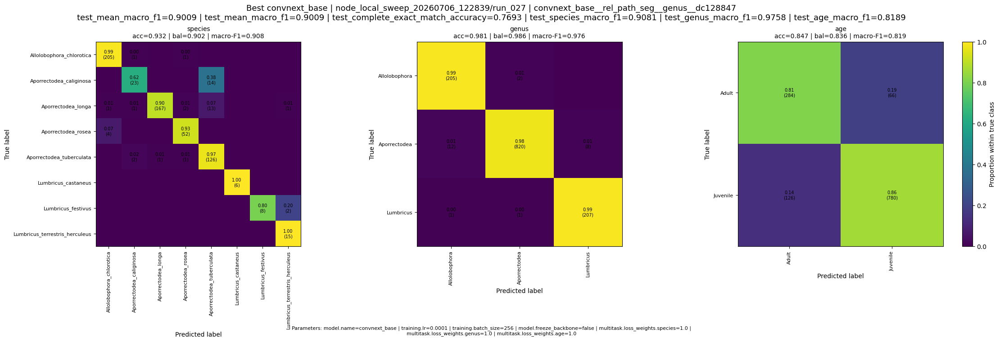


Strict species labels masked because of taxonomic uncertainty:
taxon_label
Aporrectodea_caliginosa_tuberculata    2115
Lumbricus_sp                            925
Name: count, dtype: int64
Initial dataset size: 6193
After removing invalid images, dataset size: 6191

Masking rare classes per task (min_individuals_per_class=3)

Classes retained for task 'genus' (genus):
genus
Aporrectodea     740
Lumbricus        189
Allolobophora    176
Name: barcode, dtype: int64

Classes retained for task 'species' (species_label):
species_label
Allolobophora_chlorotica          176
Aporrectodea_longa                159
Aporrectodea_tuberculata          105
Aporrectodea_rosea                 52
Aporrectodea_caliginosa            36
Lumbricus_festivus                 12
Lumbricus_terrestris_herculeus      8
Lumbricus_castaneus                 4
Name: barcode, dtype: int64

Classes retained for task 'age' (life_stage):
life_stage
Juvenile    823
Adult       282
Name: barcode, dtype: int64

Final usable

/tmp/ipykernel_542746/1868593003.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")
/tmp/ipykernel_542746/629030761.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_01_convnext_base__convnext_base__rel_path_seg__genus__dc128847/random_examples_all_tasks_pred_cam.png


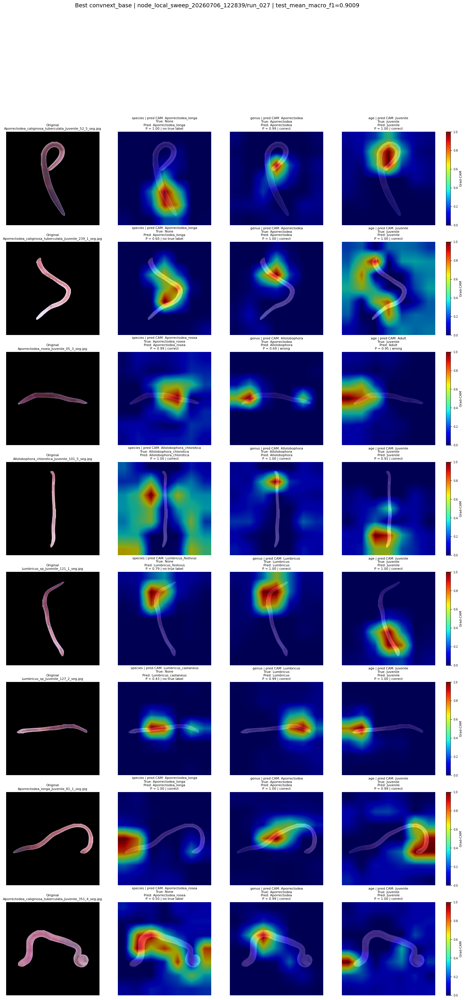

Best vit_b_16 | node_local_sweep_20260706_122839/run_145 | test_mean_macro_f1=0.8985
Run name: vit_b_16__rel_path_seg__genus__b63b4a48
Run directory: /home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_145/vit_b_16__rel_path_seg__genus__b63b4a48
Parameters: model.name=vit_b_16 | training.lr=0.0001 | training.batch_size=256 | model.freeze_backbone=false | multitask.loss_weights.species=1.0 | multitask.loss_weights.genus=0.5 | multitask.loss_weights.age=0.5


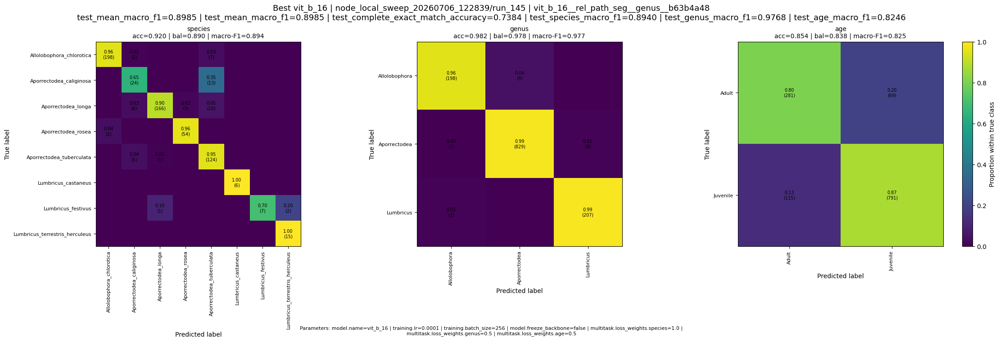


Strict species labels masked because of taxonomic uncertainty:
taxon_label
Aporrectodea_caliginosa_tuberculata    2115
Lumbricus_sp                            925
Name: count, dtype: int64
Initial dataset size: 6193
After removing invalid images, dataset size: 6191

Masking rare classes per task (min_individuals_per_class=3)

Classes retained for task 'genus' (genus):
genus
Aporrectodea     740
Lumbricus        189
Allolobophora    176
Name: barcode, dtype: int64

Classes retained for task 'species' (species_label):
species_label
Allolobophora_chlorotica          176
Aporrectodea_longa                159
Aporrectodea_tuberculata          105
Aporrectodea_rosea                 52
Aporrectodea_caliginosa            36
Lumbricus_festivus                 12
Lumbricus_terrestris_herculeus      8
Lumbricus_castaneus                 4
Name: barcode, dtype: int64

Classes retained for task 'age' (life_stage):
life_stage
Juvenile    823
Adult       282
Name: barcode, dtype: int64

Final usable

/tmp/ipykernel_542746/1868593003.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")
/tmp/ipykernel_542746/629030761.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_02_vit_b_16__vit_b_16__rel_path_seg__genus__b63b4a48/random_examples_all_tasks_pred_cam.png


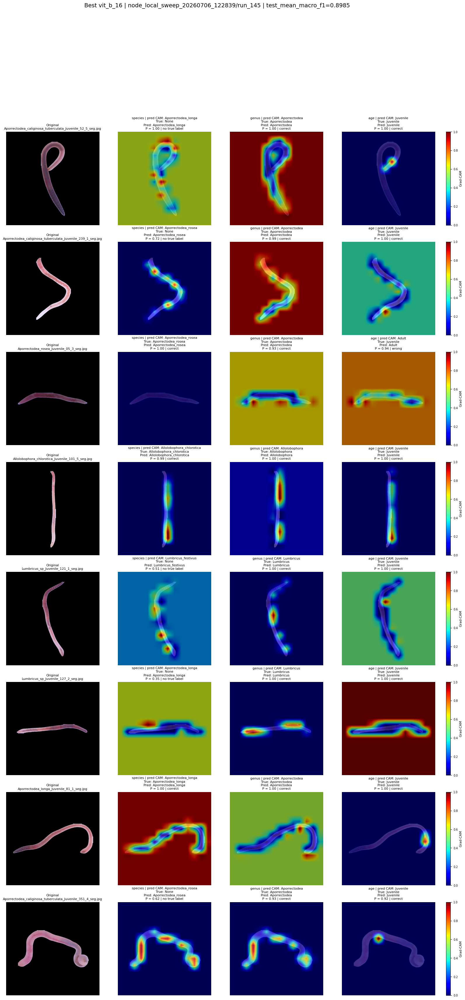

Best resnet18 | node_local_sweep_20260706_122839/run_179 | test_mean_macro_f1=0.8855
Run name: resnet18__rel_path_seg__genus__68d3b62a
Run directory: /home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_179/resnet18__rel_path_seg__genus__68d3b62a
Parameters: model.name=resnet18 | training.lr=0.0003 | training.batch_size=256 | model.freeze_backbone=false | multitask.loss_weights.species=2.0 | multitask.loss_weights.genus=0.5 | multitask.loss_weights.age=2.0


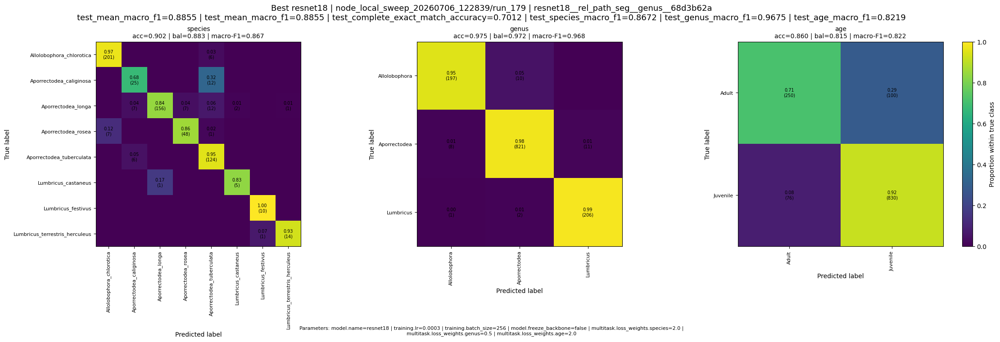


Strict species labels masked because of taxonomic uncertainty:
taxon_label
Aporrectodea_caliginosa_tuberculata    2115
Lumbricus_sp                            925
Name: count, dtype: int64
Initial dataset size: 6193
After removing invalid images, dataset size: 6191

Masking rare classes per task (min_individuals_per_class=3)

Classes retained for task 'genus' (genus):
genus
Aporrectodea     740
Lumbricus        189
Allolobophora    176
Name: barcode, dtype: int64

Classes retained for task 'species' (species_label):
species_label
Allolobophora_chlorotica          176
Aporrectodea_longa                159
Aporrectodea_tuberculata          105
Aporrectodea_rosea                 52
Aporrectodea_caliginosa            36
Lumbricus_festivus                 12
Lumbricus_terrestris_herculeus      8
Lumbricus_castaneus                 4
Name: barcode, dtype: int64

Classes retained for task 'age' (life_stage):
life_stage
Juvenile    823
Adult       282
Name: barcode, dtype: int64

Final usable

/tmp/ipykernel_542746/1868593003.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")
/tmp/ipykernel_542746/629030761.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_03_resnet18__resnet18__rel_path_seg__genus__68d3b62a/random_examples_all_tasks_pred_cam.png


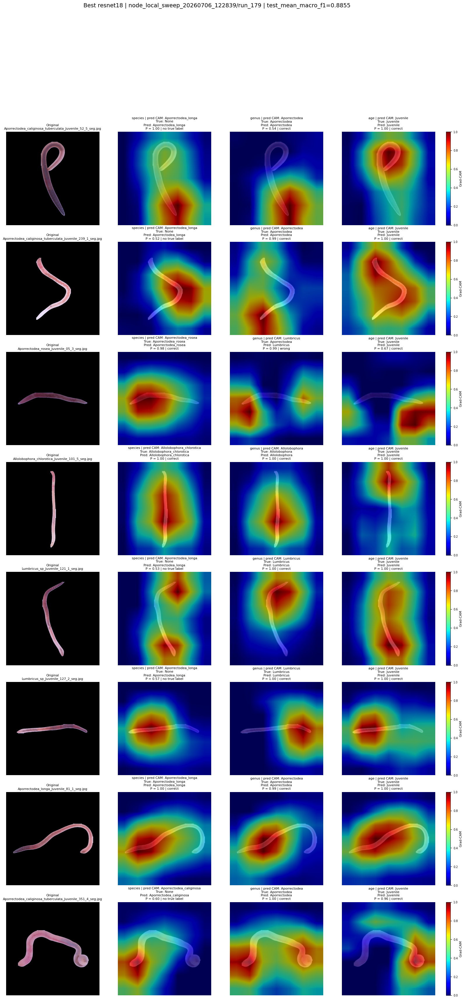

Best efficientnet_b1 | node_local_sweep_20260706_122839/run_308 | test_mean_macro_f1=0.8811
Run name: efficientnet_b1__rel_path_seg__genus__ba032066
Run directory: /home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_308/efficientnet_b1__rel_path_seg__genus__ba032066
Parameters: model.name=efficientnet_b1 | training.lr=0.0001 | training.batch_size=256 | model.freeze_backbone=false | multitask.loss_weights.species=1.0 | multitask.loss_weights.genus=0.5 | multitask.loss_weights.age=2.0


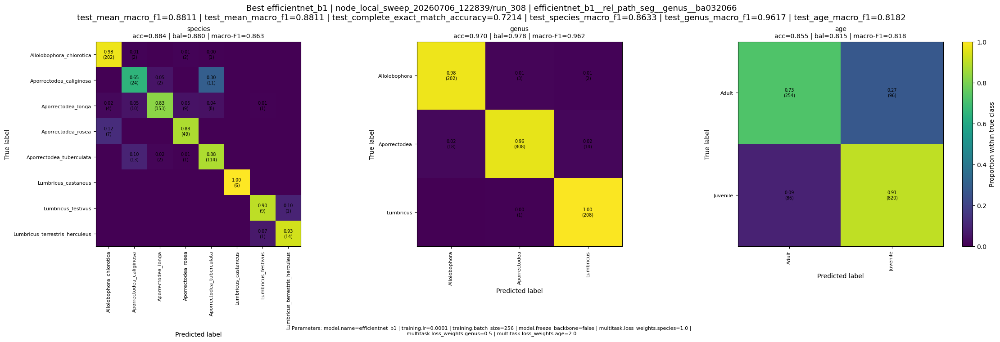


Strict species labels masked because of taxonomic uncertainty:
taxon_label
Aporrectodea_caliginosa_tuberculata    2115
Lumbricus_sp                            925
Name: count, dtype: int64
Initial dataset size: 6193
After removing invalid images, dataset size: 6191

Masking rare classes per task (min_individuals_per_class=3)

Classes retained for task 'genus' (genus):
genus
Aporrectodea     740
Lumbricus        189
Allolobophora    176
Name: barcode, dtype: int64

Classes retained for task 'species' (species_label):
species_label
Allolobophora_chlorotica          176
Aporrectodea_longa                159
Aporrectodea_tuberculata          105
Aporrectodea_rosea                 52
Aporrectodea_caliginosa            36
Lumbricus_festivus                 12
Lumbricus_terrestris_herculeus      8
Lumbricus_castaneus                 4
Name: barcode, dtype: int64

Classes retained for task 'age' (life_stage):
life_stage
Juvenile    823
Adult       282
Name: barcode, dtype: int64

Final usable

/tmp/ipykernel_542746/1868593003.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")
/tmp/ipykernel_542746/629030761.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_04_efficientnet_b1__efficientnet_b1__rel_path_seg__genus__ba032066/random_examples_all_tasks_pred_cam.png


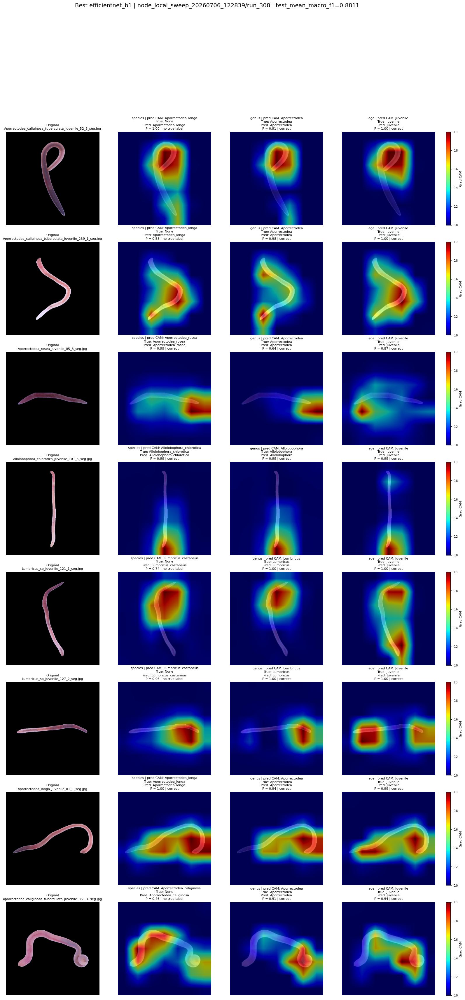

Best efficientnet_b0 | node_local_sweep_20260703_164317/run_031 | test_mean_macro_f1=0.8762
Run name: efficientnet_b0__rel_path_seg__genus__e84ef6e5
Run directory: /home/devd/worm-species/outputs_slurm/node_local_sweep_20260703_164317/run_031/efficientnet_b0__rel_path_seg__genus__e84ef6e5
Parameters: model.name=efficientnet_b0 | training.lr=0.0001 | training.batch_size=256 | model.freeze_backbone=false | multitask.loss_weights.age=0.5


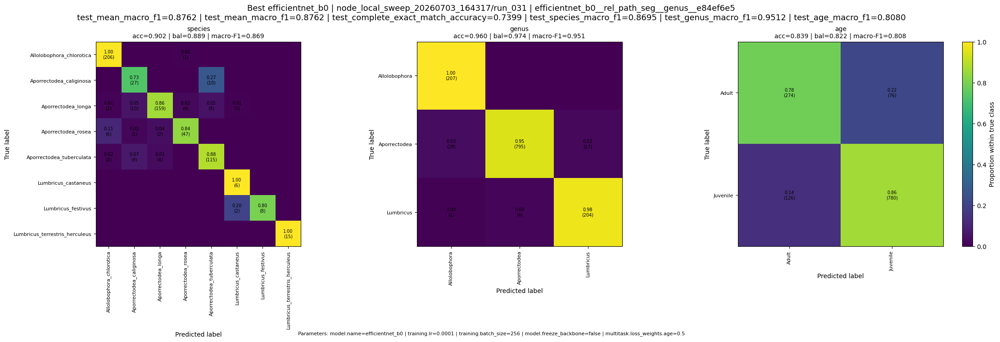


Strict species labels masked because of taxonomic uncertainty:
taxon_label
Aporrectodea_caliginosa_tuberculata    2115
Lumbricus_sp                            925
Name: count, dtype: int64
Initial dataset size: 6193
After removing invalid images, dataset size: 6191

Masking rare classes per task (min_individuals_per_class=3)

Classes retained for task 'genus' (genus):
genus
Aporrectodea     740
Lumbricus        189
Allolobophora    176
Name: barcode, dtype: int64

Classes retained for task 'species' (species_label):
species_label
Allolobophora_chlorotica          176
Aporrectodea_longa                159
Aporrectodea_tuberculata          105
Aporrectodea_rosea                 52
Aporrectodea_caliginosa            36
Lumbricus_festivus                 12
Lumbricus_terrestris_herculeus      8
Lumbricus_castaneus                 4
Name: barcode, dtype: int64

Classes retained for task 'age' (life_stage):
life_stage
Juvenile    823
Adult       282
Name: barcode, dtype: int64

Final usable

/tmp/ipykernel_542746/1868593003.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")
/tmp/ipykernel_542746/629030761.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_05_efficientnet_b0__efficientnet_b0__rel_path_seg__genus__e84ef6e5/random_examples_all_tasks_pred_cam.png


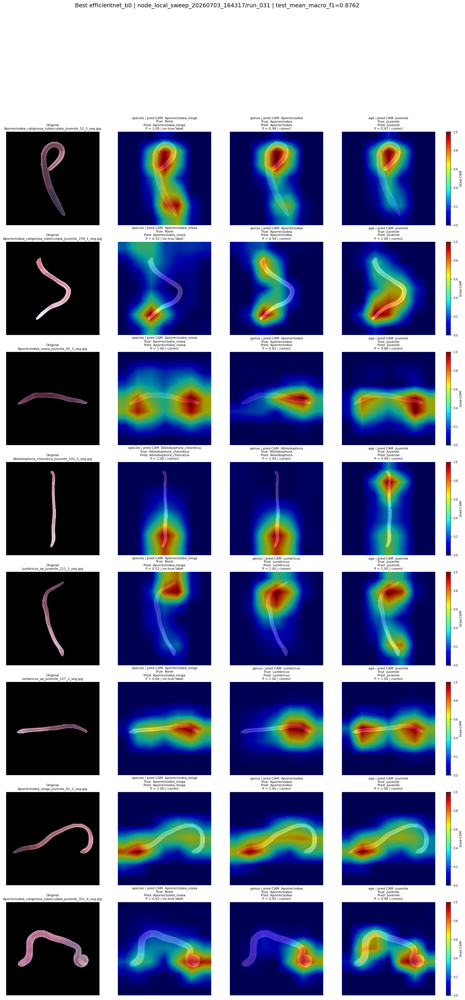

Best resnet50 | node_local_sweep_20260706_122839/run_259 | test_mean_macro_f1=0.8691
Run name: resnet50__rel_path_seg__genus__238756f3
Run directory: /home/devd/worm-species/outputs_slurm/node_local_sweep_20260706_122839/run_259/resnet50__rel_path_seg__genus__238756f3
Parameters: model.name=resnet50 | training.lr=0.0001 | training.batch_size=256 | model.freeze_backbone=false | multitask.loss_weights.species=2.0 | multitask.loss_weights.genus=0.5 | multitask.loss_weights.age=0.5


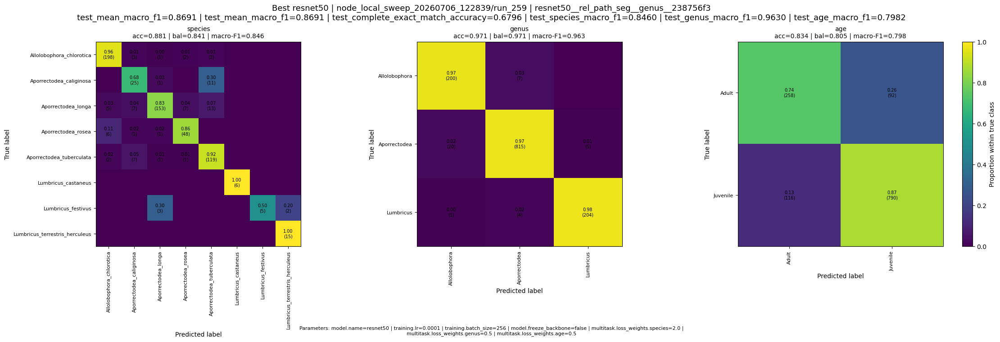


Strict species labels masked because of taxonomic uncertainty:
taxon_label
Aporrectodea_caliginosa_tuberculata    2115
Lumbricus_sp                            925
Name: count, dtype: int64
Initial dataset size: 6193
After removing invalid images, dataset size: 6191

Masking rare classes per task (min_individuals_per_class=3)

Classes retained for task 'genus' (genus):
genus
Aporrectodea     740
Lumbricus        189
Allolobophora    176
Name: barcode, dtype: int64

Classes retained for task 'species' (species_label):
species_label
Allolobophora_chlorotica          176
Aporrectodea_longa                159
Aporrectodea_tuberculata          105
Aporrectodea_rosea                 52
Aporrectodea_caliginosa            36
Lumbricus_festivus                 12
Lumbricus_terrestris_herculeus      8
Lumbricus_castaneus                 4
Name: barcode, dtype: int64

Classes retained for task 'age' (life_stage):
life_stage
Juvenile    823
Adult       282
Name: barcode, dtype: int64

Final usable

/tmp/ipykernel_542746/1868593003.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")
/tmp/ipykernel_542746/629030761.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)


Saved: /home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_06_resnet50__resnet50__rel_path_seg__genus__238756f3/random_examples_all_tasks_pred_cam.png


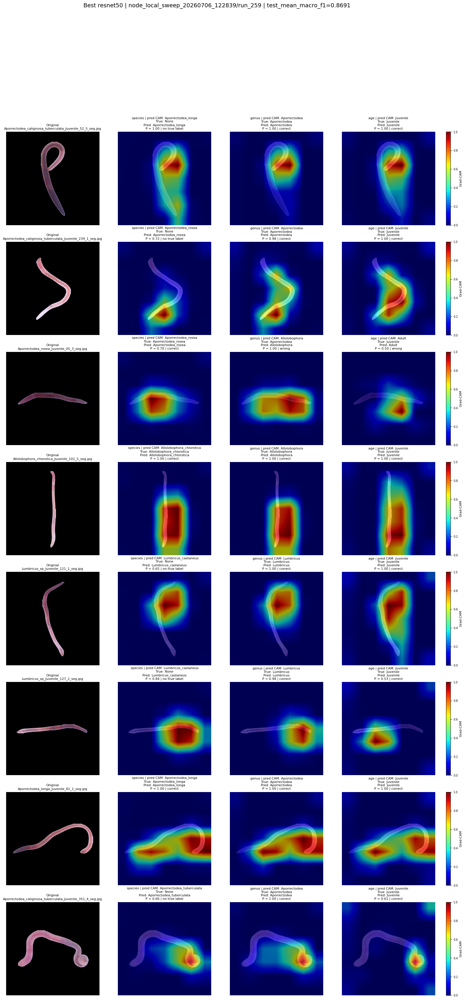


Saved outputs:
/home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_01_convnext_base__convnext_base__rel_path_seg__genus__dc128847/confusion_matrices_with_scores.png
/home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_01_convnext_base__convnext_base__rel_path_seg__genus__dc128847/random_examples_all_tasks_pred_cam.png
/home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_02_vit_b_16__vit_b_16__rel_path_seg__genus__b63b4a48/confusion_matrices_with_scores.png
/home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_02_vit_b_16__vit_b_16__rel_path_seg__genus__b63b4a48/random_examples_all_tasks_pred_cam.png
/home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_03_resnet18__resnet18__rel_path_seg__genus__68d3b62a/confusion_matrices_with_scores.png
/home/devd/worm-species/outputs_slurm/combined_gradcam_top_model_families/rank_03_resnet18__resnet18__rel_path_seg__genus

In [102]:
all_saved_paths = []

for _, row in top_by_model.iterrows():
    model_type = str(row["model_type"])
    run_name = str(row["run_name"])
    score = row[RANK_BY]

    run_slug = f"rank_{int(row['model_family_rank']):02d}_{safe_slug(model_type)}__{safe_slug(run_name)}"
    run_out_dir = (
        ANALYSIS_DIR
        / run_slug
    )
    run_figure_dir = FIGURE_DIR / run_slug
    run_out_dir.mkdir(parents=True, exist_ok=True)
    run_figure_dir.mkdir(parents=True, exist_ok=True)

    override_text, override_path = read_run_overrides(row)
    parameter_summary = compact_overrides_text(override_text)

    run_label = (
        f"Best {model_type} | {row.get('sweep_id', '')}/{row.get('source_run_id', '')} | "
        f"{RANK_BY}={score:.4f}"
    )

    (run_out_dir / "run_overrides.args").write_text(
        override_text if override_text else "run_overrides.args not found"
    )

    (run_out_dir / "run_summary.txt").write_text(
        "\n".join(
            [
                run_label,
                f"Model family: {model_type}",
                f"Run name: {run_name}",
                f"Run directory: {row['artifact_dir']}",
                f"Override file: {override_path if override_path is not None else 'not found'}",
                "",
                "Scores:",
                run_score_text(row),
                "",
                "Compact parameter summary:",
                parameter_summary,
                "",
                "Full run_overrides.args:",
                override_text if override_text else "not found",
            ]
        )
    )

    print("=" * 120)
    print(run_label)
    print("Run name:", run_name)
    print("Run directory:", row["artifact_dir"])
    print(parameter_summary)

    cm_path = plot_confusion_matrices_for_run(
        row=row,
        tasks=TASKS_TO_PLOT,
        out_dir=run_figure_dir,
        parameter_summary=parameter_summary,
    )
    all_saved_paths.append(cm_path)

    ctx = load_run_context(row)

    example_row = ctx.eval_df.sample(1, random_state=RANDOM_STATE).iloc[0]
    _, example_x, _ = load_row_image(ctx, example_row)
    target_layer = find_gradcam_target_layer(ctx.model, example_x)

    gradcam_path = run_figure_dir / f"random_examples_all_tasks_{CAM_MODE}_cam.png"
    plot_random_examples_all_tasks(
        ctx=ctx,
        target_layer=target_layer,
        n_examples=N_RANDOM_EXAMPLES,
        random_state=RANDOM_STATE,
        save_path=gradcam_path,
        title_prefix=run_label,
        
    )
    all_saved_paths.append(gradcam_path)

    del ctx
    torch.cuda.empty_cache()


print("\nSaved outputs:")
for path in all_saved_paths:
    print(path)


## 8. Notes for interpretation

- The confusion matrices are row-normalised: each row corresponds to a true class and sums to 1.
- The numbers inside each non-zero cell show `normalised proportion` and the raw count in parentheses.
- Grad-CAM examples are sampled from the preferred split only if split information is available in the prepared metadata. Otherwise, they are sampled from all labelled rows.
- For publication figures, use held-out-individual or test-set examples, not training examples.
